In [33]:
import pandas as pd
import numpy as np
import datetime as dt
from datetime import date
import pandas_datareader as web
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings("ignore")
# Generate Word Cloud image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Read sentiment result for Top 5 Cryptos and News

In [34]:
news = pd.read_csv(r"Data/text_data/News_sentiment.csv", sep="\t")

#crypto
MANA_announcement = pd.read_csv(r"Data/text_data/MANA_Announcement_sentiment.csv", sep="\t")
MANA_general = pd.read_csv(r"Data/text_data/MANA_General_sentiment.csv", sep="\t")

SAND_announcement = pd.read_csv(r"Data/text_data/SAND_Announcement_sentiment.csv", sep="\t")
SAND_general = pd.read_csv(r"Data/text_data/SAND_General_sentiment.csv", sep="\t")

THETA_announcement = pd.read_csv(r"Data/text_data/THETA_Announcement_sentiment.csv", sep="\t")
THETA_general = pd.read_csv(r"Data/text_data/THETA_General_sentiment.csv", sep="\t")

AXS_announcement = pd.read_csv(r"Data/text_data/AXS_Announcement_sentiment.csv", sep="\t")
AXS_general = pd.read_csv(r"Data/text_data/AXS_General_sentiment.csv", sep="\t")

STX_announcement = pd.read_csv(r"Data/text_data/STX_Announcement_sentiment.csv", sep="\t")
STX_general = pd.read_csv(r"Data/text_data/STX_General_sentiment.csv", sep="\t")

# Group sentiment score to daily (average)

In [35]:
def match_date(start, end, data):
    data.date = pd.to_datetime(data.date)
    data = data[(data['date'] >= start) & (data['date'] <= end)]
    data["date"] = data["date"].apply(lambda x: pd.to_datetime(x, unit="ns", utc=True).floor('D').date())
    #data.columns = data.columns.str.replace('Date', 'date')
    return data

In [36]:
def sentiment_groupby_day(data):
    data.drop(columns=data.columns[0], axis=1, inplace=True)
    data.drop(columns=data.columns[0], axis=1, inplace=True)
    data.drop(columns=data.columns[1], axis=1, inplace=True)
    data = data.groupby(['date'])['sentiment_score'].mean().reset_index().rename(columns={'mean':'sentiment score'})
    data = data.set_index('date') 
    
    data["sentiment_score_1"] = data.shift(1)
    
    data = data.sort_index() # sort by datetime
    return data

In [37]:
def filter_news_sentiment(start, end, data):
    data["date"] = data["date"].apply(lambda x: pd.to_datetime(x, unit="ns", utc=True).floor('D').date())
    crypto_news = data[(data['category'] == 'Cryptocurrencies')].reset_index()
    stocks_market_news = data[(data['category'] == 'Stock Market')].reset_index()
    finance_news = data[(data['category'] == 'Finance')].reset_index()
    #metaverse_news = data[(data['category'] == 'Metaverse')].reset_index()
    
    crypto_news = split_news_category(crypto_news)
    stocks_market_news = split_news_category(stocks_market_news)
    finance_news = split_news_category(finance_news)
    #metaverse_news = split_news_category(metaverse_news, remove_pos_bias, remove_neg_bias)
    
    return crypto_news,stocks_market_news,finance_news

In [38]:
def split_news_category(data):
    #group daily sentiment score
    data = data.drop(['content'], axis=1)
    data = data.groupby(['date'])['sentiment_score'].mean().reset_index().rename(columns={'mean':'sentiment score'})
    data = data.set_index('date') 
    data = data.sort_index() # sort by datetime
    data = data.reset_index()
    
    data = data.set_index('date')
    
    data["sentiment_score_1"] = data.shift(1)
    return data

In [39]:
start = dt.datetime(2021,10,1)
end = dt.datetime(2022,4,29)

In [40]:
crypto_news, stocks_market_news, finance_news = filter_news_sentiment(start, end, news)

In [41]:
#crypto sentiment group processing
mana_announcement_by_day = sentiment_groupby_day(match_date(start, end, MANA_announcement))
mana_general_by_day = sentiment_groupby_day(match_date(start, end, MANA_general))
mana_announcement_by_day = mana_announcement_by_day.fillna(0)

sand_announcement_by_day = sentiment_groupby_day(match_date(start, end, SAND_announcement))
sand_general_by_day = sentiment_groupby_day(match_date(start, end, SAND_general))
sand_announcement_by_day = sand_announcement_by_day.fillna(0)

theta_announcement_by_day = sentiment_groupby_day(match_date(start, end, THETA_announcement))
theta_general_by_day = sentiment_groupby_day(match_date(start, end, THETA_general))
theta_announcement_by_day = theta_announcement_by_day.fillna(0)

axs_announcement_by_day = sentiment_groupby_day(match_date(start, end, AXS_announcement))
axs_general_by_day = sentiment_groupby_day(match_date(start, end, AXS_general))
axs_announcement_by_day = axs_announcement_by_day.fillna(0)

stx_announcement_by_day = sentiment_groupby_day(match_date(start, end, STX_announcement))
stx_general_by_day = sentiment_groupby_day(match_date(start, end, STX_general))
stx_announcement_by_day = stx_announcement_by_day.fillna(0)

In [42]:
#read crypto pricing
#extract data from yahoo finance
MANA = web.DataReader('MANA-USD','yahoo', start, end)
SAND = web.DataReader('SAND-USD','yahoo', start, end)
THETA = web.DataReader('THETA-USD','yahoo', start, end)
AXS = web.DataReader('AXS-USD','yahoo', start, end)
STX = web.DataReader('STX-USD','yahoo', start, end)

In [43]:
MANA = MANA.reset_index()
SAND = SAND.reset_index()
THETA = THETA.reset_index()
AXS = AXS.reset_index()
STX = STX.reset_index()

In [44]:
MANA.columns = MANA.columns.str.replace('Date', 'date')
SAND.columns = SAND.columns.str.replace('Date', 'date')
THETA.columns = THETA.columns.str.replace('Date', 'date')
AXS.columns = AXS.columns.str.replace('Date', 'date')
STX.columns = STX.columns.str.replace('Date', 'date')

#match date with sentiment score
MANA = match_date(start, end, MANA)
SAND = match_date(start, end, SAND)
THETA = match_date(start, end, THETA)
AXS = match_date(start, end, AXS)
STX = match_date(start, end, STX)

In [45]:
#add pct change column to capture daily crypto price change
ClosingPrice = MANA[['Adj Close']]
MANA['pct_change'] = ClosingPrice.pct_change()*100
#add pct change column
ClosingPrice = SAND[['Adj Close']]
SAND['pct_change'] = ClosingPrice.pct_change()*100
#add pct change column
ClosingPrice = THETA[['Adj Close']]
THETA['pct_change'] = ClosingPrice.pct_change()*100
#add pct change column
ClosingPrice = AXS[['Adj Close']]
AXS['pct_change'] = ClosingPrice.pct_change()*100
#add pct change column
ClosingPrice = STX[['Adj Close']]
STX['pct_change'] = ClosingPrice.pct_change()*100

MANA = MANA.set_index('date')
SAND = SAND.set_index('date')
THETA = THETA.set_index('date')
AXS = AXS.set_index('date')
STX = STX.set_index('date')

MANA.to_csv(r"Data/price/{0}_price.csv".format("MANA"), sep="\t")
SAND.to_csv(r"Data/price/{0}_price.csv".format("SAND"), sep="\t")
THETA.to_csv(r"Data/price/{0}_price.csv".format("THETA"), sep="\t")
AXS.to_csv(r"Data/price/{0}_price.csv".format("AXS"), sep="\t")
STX.to_csv(r"Data/price/{0}_price.csv".format("STX"), sep="\t")

In [46]:
def plot_xy(ax,x, data, title):
    # first plot crypto news vs price change
    ax[x].plot(data.index, data['sentiment_score'], color="red", marker="o")
    # set x-axis label
    ax[x].set_xlabel("Date",fontsize=14)
    #ax[x,y].set_xticklabels(data.index, rotation=45)
    # set y-axis label
    ax[x].set_ylabel("Sentiment score",color="red",fontsize=14)
    ax[x].set_title(title, fontsize=14)
    # twin object for two different y-axis on the sample plot
    ax2=ax[x].twinx()
    # make a plot with different y-axis using second axis object
    ax2.plot(data.index, data['pct_change'],color="blue",marker="o")
    ax2.set_ylabel("Daily Percentage Change",color="blue",fontsize=14)

In [47]:
def sentiment_price_corr(data):
    # Compute the correlation matrix
    # plotting correlation heatmap
    dataplot = sns.heatmap(data.corr(), annot=True,linewidths=.5)

# Explore Correlation between sentiment score and Price change

Compare the correlation between sentiment score and price change without lagged score index

In [48]:
merge_data = pd.DataFrame({ 
                            'Crypto News Sentiment': crypto_news.sentiment_score,
                            'Stock Market News Sentiment': stocks_market_news.sentiment_score,
                            'Finance News Sentiment': finance_news.sentiment_score,
                            'MANA Price Change' :  MANA['pct_change'],
                            'MANA Announcement Sentiment': mana_announcement_by_day.sentiment_score,
                            'MANA General Sentiment':mana_general_by_day.sentiment_score,
                            'SAND Price Change' :  SAND['pct_change'],
                            'SAND Announcement Sentiment': sand_announcement_by_day.sentiment_score,
                            'SAND General Sentiment':sand_general_by_day.sentiment_score,
                            'THETA Price Change' :  THETA['pct_change'],
                            'THETA Announcement Sentiment': theta_announcement_by_day.sentiment_score,
                            'THETA General Sentiment':theta_general_by_day.sentiment_score,
                            'AXS Price Change' :  AXS['pct_change'],
                            'AXS Announcement Sentiment': axs_announcement_by_day.sentiment_score,
                            'AXS General Sentiment':axs_general_by_day.sentiment_score,
                            'STX Price Change' :  STX['pct_change'],
                            'STX Announcement Sentiment': stx_announcement_by_day.sentiment_score,
                            'STX General Sentiment':stx_general_by_day.sentiment_score
                          })

In [49]:
crypto_summary = merge_data.describe()

In [50]:
crypto_summary.T

,count,mean,std,min,25%,50%,75%,max
Crypto News Sentiment,208.0,0.051392,0.296211,-0.964458,-0.078611,0.065063,0.213769,0.830385
Stock Market News Sentiment,196.0,0.094445,0.275697,-0.860075,-0.060330,0.106294,0.234096,0.972315
Finance News Sentiment,211.0,-0.051767,0.127265,-0.493201,-0.118738,-0.041994,0.024828,0.374840
MANA Price Change,210.0,0.913592,12.909687,-18.863676,-3.862073,-0.377413,3.218068,154.738406
MANA Announcement Sentiment,47.0,0.037853,0.063858,-0.073532,0.008516,0.024366,0.053424,0.252991
MANA General Sentiment,211.0,0.036445,0.013780,-0.026008,0.028464,0.036839,0.045100,0.068979
SAND Price Change,210.0,0.854451,8.988221,-17.644210,-4.089958,-0.480892,3.614917,57.795167
SAND Announcement Sentiment,63.0,0.051709,0.084827,-0.297889,0.011075,0.039414,0.063605,0.289323
SAND General Sentiment,211.0,0.037858,0.006802,0.016068,0.033287,0.038149,0.042335,0.056771
THETA Price Change,210.0,-0.230857,5.925377,-18.709536,-3.617005,-0.568374,3.451576,21.630936


# Filter sentiment score only between 0.3 above and -0.3 above

## Explore total count of Sentiment

This helps us to understand how the sentiment polarity generated.

In [19]:
def get_total_sentiment(sentiments, title):
    print("The total number of data: ", len(sentiments))
    
    data = []
    for item in sentiments:
        if item >= 0.3:
            data.append("Positive")
        elif item <= -0.3:
            data.append("Negative")
        else:
            data.append("Neutral")
    
    plt.figure(figsize=(10,6))
    
    palette ={"Positive": "C0", "Neutral": "C1", "Negative": "C2"}
    
    ax = sns.countplot(x=data, palette=palette, order = data.sort())
    for container in ax.containers:
        ax.bar_label(container)
    
    plt.title('{0}: The number of data'.format(title))
    plt.show()

The total number of data:  208


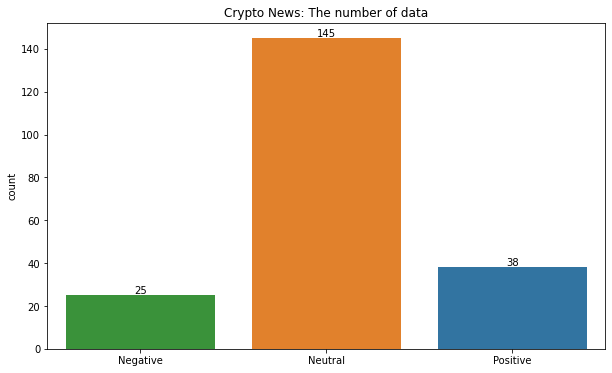

In [20]:
get_total_sentiment(crypto_news.sentiment_score, "Crypto News")

The total number of data:  196


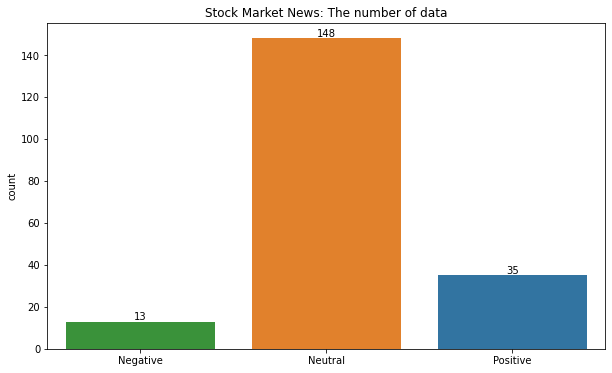

In [21]:
get_total_sentiment(stocks_market_news.sentiment_score, "Stock Market News")

The total number of data:  211


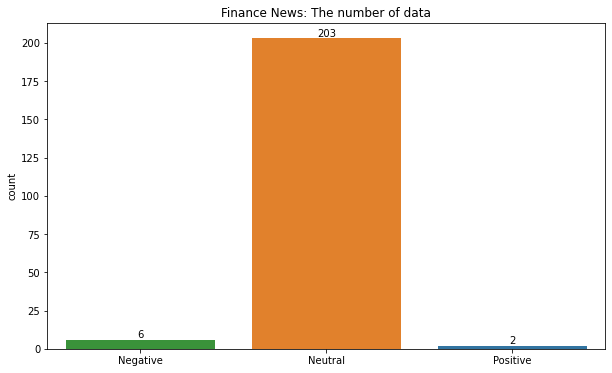

In [22]:
get_total_sentiment(finance_news.sentiment_score, "Finance News")

The total number of data:  47


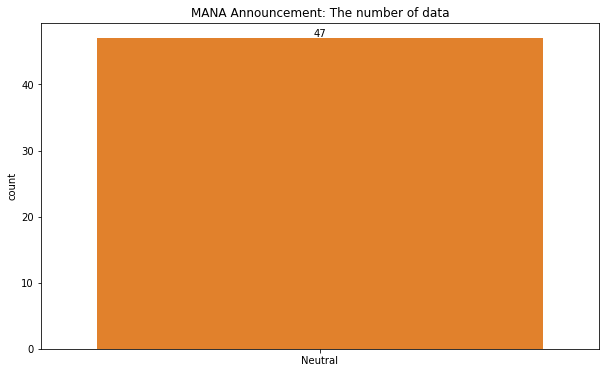

In [23]:
get_total_sentiment(mana_announcement_by_day.sentiment_score, "MANA Announcement")

The total number of data:  211


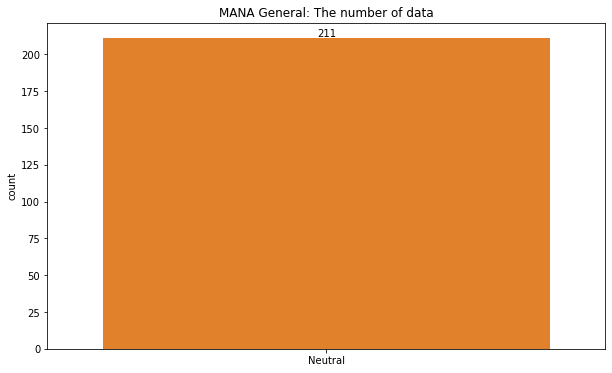

In [24]:
get_total_sentiment(mana_general_by_day.sentiment_score, "MANA General")

The total number of data:  63


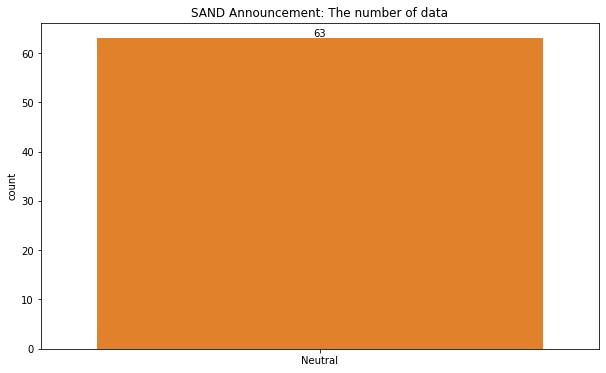

In [25]:
get_total_sentiment(sand_announcement_by_day.sentiment_score, "SAND Announcement")

The total number of data:  211


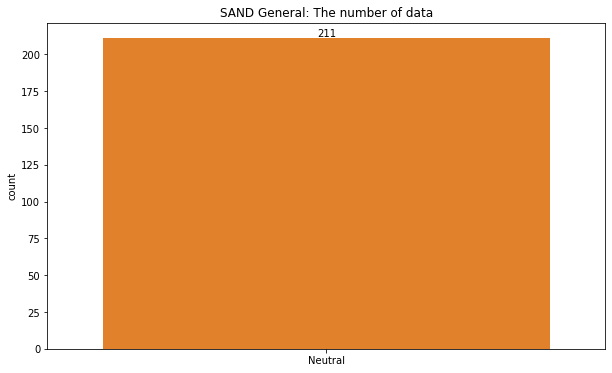

In [26]:
get_total_sentiment(sand_general_by_day.sentiment_score, "SAND General")

The total number of data:  60


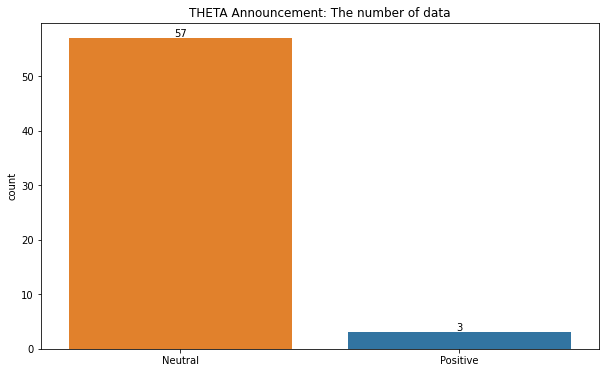

In [27]:
get_total_sentiment(theta_announcement_by_day.sentiment_score, "THETA Announcement")

The total number of data:  211


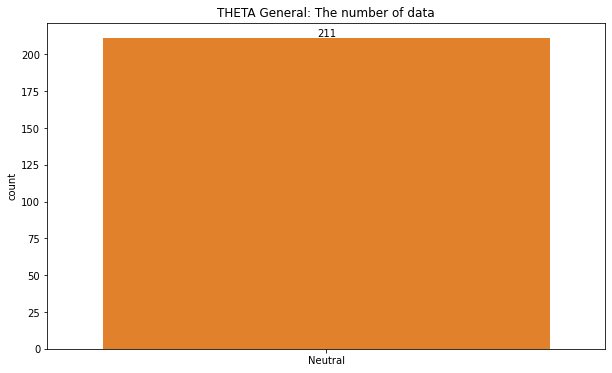

In [28]:
get_total_sentiment(theta_general_by_day.sentiment_score, "THETA General")

The total number of data:  108


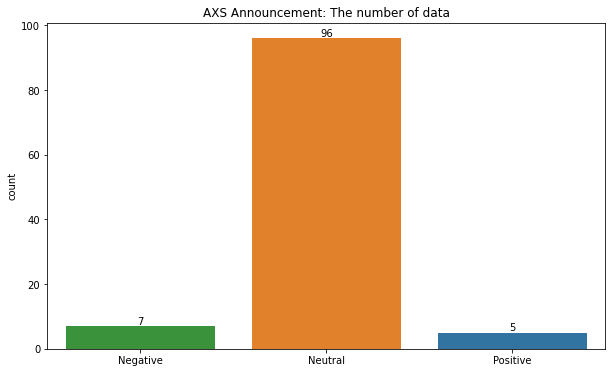

In [29]:
get_total_sentiment(axs_announcement_by_day.sentiment_score, "AXS Announcement")

The total number of data:  169


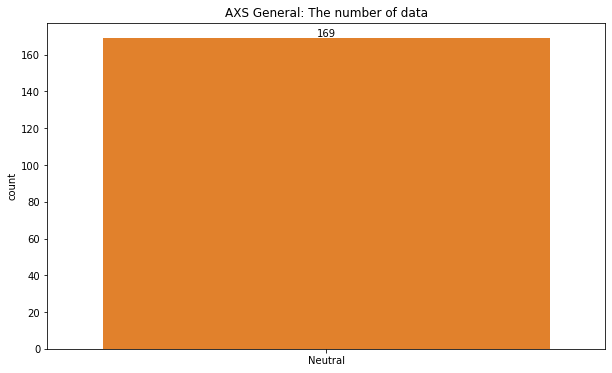

In [30]:
get_total_sentiment(axs_general_by_day.sentiment_score, "AXS General")

The total number of data:  32


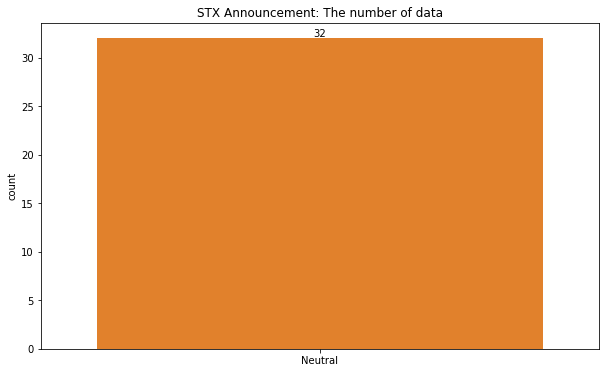

In [31]:
get_total_sentiment(stx_announcement_by_day.sentiment_score, "STX Announcement")

The total number of data:  211


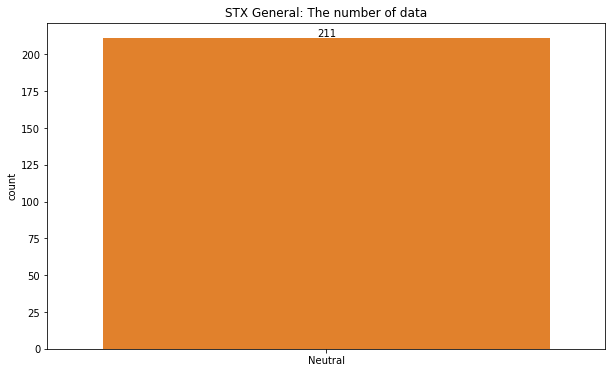

In [32]:
get_total_sentiment(stx_general_by_day.sentiment_score, "STX General")

Based on the result count polarity, we could identify what need to be include for explore correlation. 
If there is no negative and positive polarity, we can skip that for the experiments. 

### MANA

In [51]:
#remove all the sentiment score left only between -0.5 above or more than 0.5
positive = 0.3
negative = -0.3

crypto_news_filter = crypto_news[(crypto_news['sentiment_score'] > positive) | (crypto_news['sentiment_score'] < negative)]
stocks_market_news_filter = stocks_market_news[(stocks_market_news['sentiment_score'] > positive) | (stocks_market_news['sentiment_score'] < negative)]
finance_news_filter = finance_news[(finance_news['sentiment_score'] > positive) | (finance_news['sentiment_score'] < negative)]
mana_announcement_by_day_filter = mana_announcement_by_day[(mana_announcement_by_day['sentiment_score'] > positive) | (mana_announcement_by_day['sentiment_score'] < negative)]
mana_general_by_day_filter = mana_general_by_day[(mana_general_by_day['sentiment_score'] > positive) | (mana_general_by_day['sentiment_score'] < negative)]

sand_announcement_by_day_filter = sand_announcement_by_day[(sand_announcement_by_day['sentiment_score'] > positive) | (sand_announcement_by_day['sentiment_score'] < negative)]
sand_general_by_day_filter = sand_general_by_day[(sand_general_by_day['sentiment_score'] > positive) | (sand_general_by_day['sentiment_score'] < negative)]

theta_announcement_by_day_filter = theta_announcement_by_day[(theta_announcement_by_day['sentiment_score'] > positive) | (theta_announcement_by_day['sentiment_score'] < negative)]
theta_general_by_day_filter = theta_general_by_day[(theta_general_by_day['sentiment_score'] > positive) | (theta_general_by_day['sentiment_score'] < negative)]

axs_announcement_by_day_filter = axs_announcement_by_day[(axs_announcement_by_day['sentiment_score'] > positive) | (axs_announcement_by_day['sentiment_score'] < negative)]
axs_general_by_day_filter = axs_general_by_day[(axs_general_by_day['sentiment_score'] > positive) | (axs_general_by_day['sentiment_score'] < negative)]

stx_announcement_by_day_filter = stx_announcement_by_day[(stx_announcement_by_day['sentiment_score'] > positive) | (stx_announcement_by_day['sentiment_score'] < negative)]
stx_general_by_day_filter = stx_general_by_day[(stx_general_by_day['sentiment_score'] > positive) | (stx_general_by_day['sentiment_score'] < negative)]

In [55]:
crypto_news_filter

,sentiment_score,sentiment_score_1
date,,
2021-10-01,0.554997,NaN
2021-10-02,0.629249,0.554997
2021-10-03,-0.834325,0.629249
2021-10-04,0.514501,-0.834325
2021-10-07,0.402989,0.198556
...,...,...
2022-03-27,0.634299,0.133464
2022-04-10,0.405320,0.076061
2022-04-16,0.340996,-0.070874


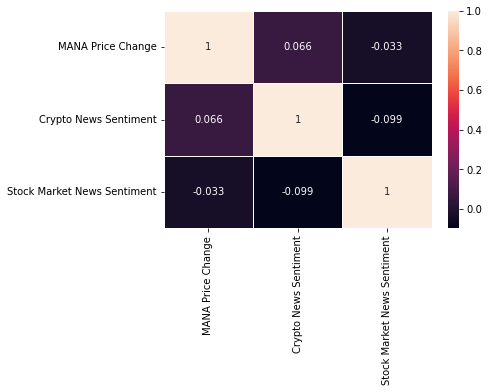

In [52]:
mana_merge_data = pd.DataFrame({ 
                            'MANA Price Change' :  MANA['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter.sentiment_score,
                            'Stock Market News Sentiment': stocks_market_news_filter.sentiment_score
                          })
sentiment_price_corr(mana_merge_data.fillna(0))

Compare the correlation between sentiment score and price change without lagged score index

In [53]:
#remove all the sentiment score left only between -0.5 above or more than 0.5
crypto_news_filter_lagged = crypto_news[(crypto_news['sentiment_score_1'] > positive) | (crypto_news['sentiment_score_1'] < negative)]
stocks_market_news_filter_lagged = stocks_market_news[(stocks_market_news['sentiment_score_1'] > positive) | (stocks_market_news['sentiment_score_1'] < negative)]
finance_news_filter_lagged = finance_news[(finance_news['sentiment_score_1'] > positive) | (finance_news['sentiment_score_1'] < negative)]
mana_announcement_by_day_filter_lagged = mana_announcement_by_day[(mana_announcement_by_day['sentiment_score_1'] > positive) | (mana_announcement_by_day['sentiment_score_1'] < negative)]
mana_general_by_day_filter_lagged = mana_general_by_day[(mana_general_by_day['sentiment_score_1'] > positive) | (mana_general_by_day['sentiment_score_1'] < negative)]

sand_announcement_by_day_filter_lagged = sand_announcement_by_day[(sand_announcement_by_day['sentiment_score_1'] > positive) | (sand_announcement_by_day['sentiment_score_1'] < negative)]
sand_general_by_day_filter_lagged = sand_general_by_day[(sand_general_by_day['sentiment_score_1'] > positive) | (sand_general_by_day['sentiment_score_1'] < negative)]

theta_announcement_by_day_filter_lagged = theta_announcement_by_day[(theta_announcement_by_day['sentiment_score_1'] > positive) | (theta_announcement_by_day['sentiment_score_1'] < negative)]
theta_general_by_day_filter_lagged = theta_general_by_day[(theta_general_by_day['sentiment_score_1'] > positive) | (theta_general_by_day['sentiment_score_1'] < negative)]

axs_announcement_by_day_filter_lagged = axs_announcement_by_day[(axs_announcement_by_day['sentiment_score_1'] > positive) | (axs_announcement_by_day['sentiment_score_1'] < negative)]
axs_general_by_day_filter_lagged = axs_general_by_day[(axs_general_by_day['sentiment_score_1'] > positive) | (axs_general_by_day['sentiment_score_1'] < negative)]

stx_announcement_by_day_filter_lagged = stx_announcement_by_day[(stx_announcement_by_day['sentiment_score_1'] > positive) | (stx_announcement_by_day['sentiment_score_1'] < negative)]
stx_general_by_day_filter_lagged = stx_general_by_day[(stx_general_by_day['sentiment_score_1'] > positive) | (stx_general_by_day['sentiment_score_1'] < negative)]

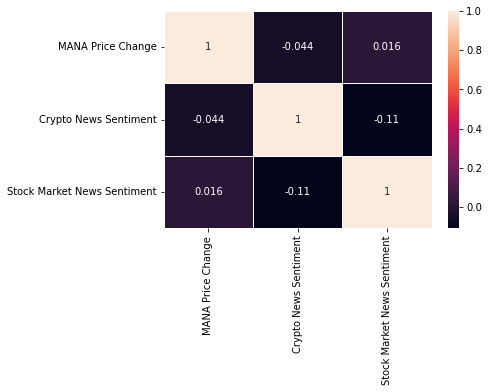

In [54]:
mana_merge_data_lagged = pd.DataFrame({ 
                            'MANA Price Change' :  MANA['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter_lagged.sentiment_score_1,
                            'Stock Market News Sentiment': stocks_market_news_filter_lagged.sentiment_score_1
                          })
sentiment_price_corr(mana_merge_data_lagged.fillna(0))

### SAND

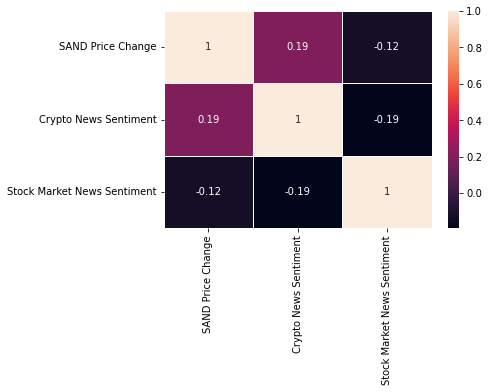

In [56]:
sand_merge_data = pd.DataFrame({ 
                            'SAND Price Change' :  SAND['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter.sentiment_score,
                            'Stock Market News Sentiment': stocks_market_news_filter.sentiment_score
                          })
sentiment_price_corr(sand_merge_data)

lagged

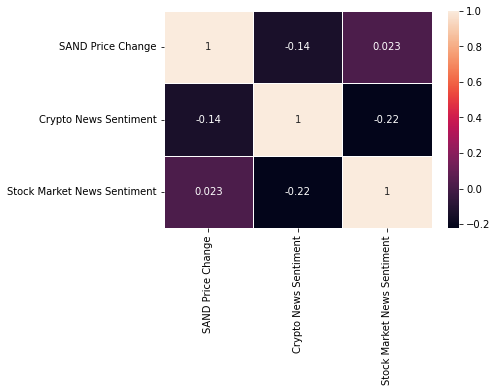

In [57]:
sand_merge_data_lagged = pd.DataFrame({ 
                            'SAND Price Change' :  SAND['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter_lagged.sentiment_score_1,
                            'Stock Market News Sentiment': stocks_market_news_filter_lagged.sentiment_score_1
                          })
sentiment_price_corr(sand_merge_data_lagged)

### THETA

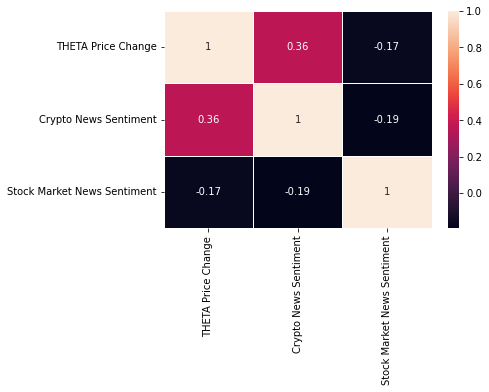

In [58]:
theta_merge_data = pd.DataFrame({ 
                            'THETA Price Change' :  THETA['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter.sentiment_score,
                            'Stock Market News Sentiment': stocks_market_news_filter.sentiment_score
                          })
sentiment_price_corr(theta_merge_data)

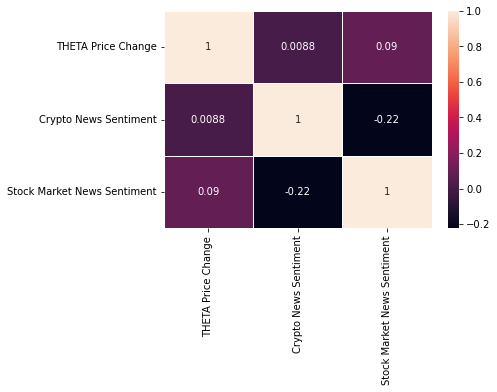

In [59]:
theta_merge_data_lagged = pd.DataFrame({ 
                            'THETA Price Change' :  THETA['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter_lagged.sentiment_score_1,
                            'Stock Market News Sentiment': stocks_market_news_filter_lagged.sentiment_score_1
                          })
sentiment_price_corr(theta_merge_data_lagged)

### AXS

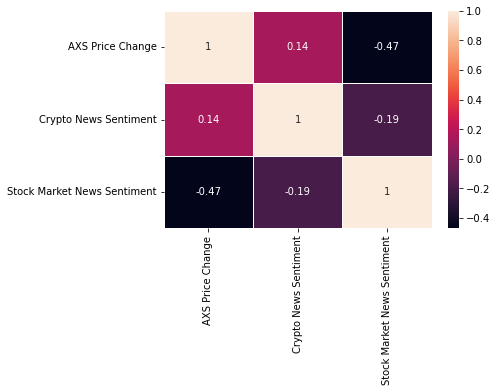

In [60]:
axs_merge_data_filter = pd.DataFrame({ 
                            'AXS Price Change' :  AXS['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter.sentiment_score,
                            'Stock Market News Sentiment': stocks_market_news_filter.sentiment_score
                          })
sentiment_price_corr(axs_merge_data_filter)

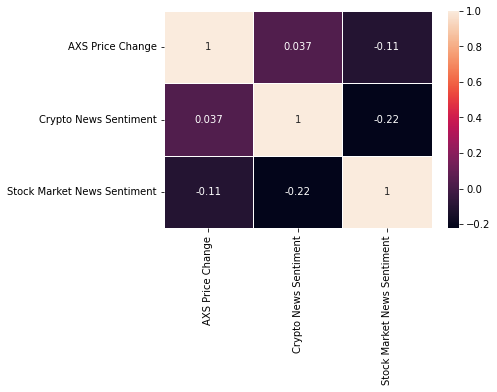

In [61]:
axs_merge_data_filter_lagged = pd.DataFrame({ 
                                'AXS Price Change' :  AXS['pct_change'],
                                'Crypto News Sentiment': crypto_news_filter_lagged.sentiment_score_1,
                                'Stock Market News Sentiment': stocks_market_news_filter_lagged.sentiment_score_1
                              })
sentiment_price_corr(axs_merge_data_filter_lagged)

### STX

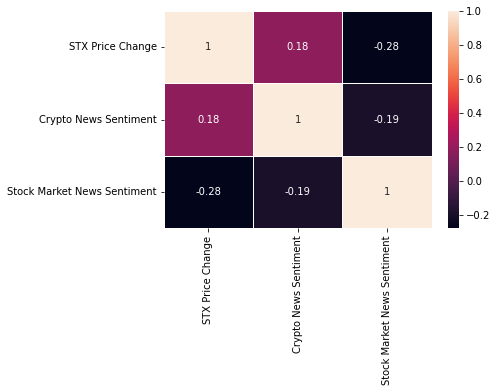

In [62]:
stx_merge_data_filter = pd.DataFrame({ 
                            'STX Price Change' :  STX['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter.sentiment_score,
                            'Stock Market News Sentiment': stocks_market_news_filter.sentiment_score
                          })
sentiment_price_corr(stx_merge_data_filter)

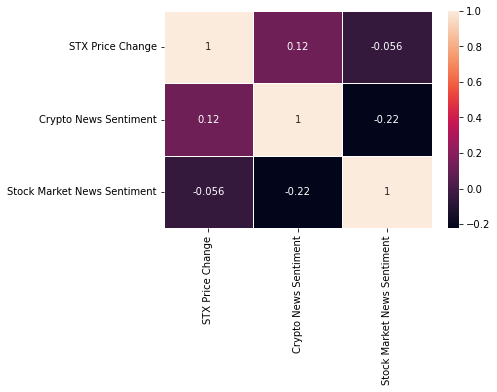

In [63]:
stx_merge_data_filter_lagged = pd.DataFrame({ 
                            'STX Price Change' :  STX['pct_change'],
                            'Crypto News Sentiment': crypto_news_filter_lagged.sentiment_score_1,
                            'Stock Market News Sentiment': stocks_market_news_filter_lagged.sentiment_score_1
                          })
sentiment_price_corr(stx_merge_data_filter_lagged)

# Discover most frequent words

In [224]:
# Word cloud visualization
def word_cloud(text):
    stopwords = set(STOPWORDS)
    allWords = ' '.join([str(nws) for nws in text])
    wordCloud = WordCloud(background_color='white',width = 1600, height = 800,stopwords = stopwords,min_font_size = 20,max_font_size=150,colormap='prism').generate(allWords)
    fig, ax = plt.subplots(figsize=(20,10), facecolor='k')
    plt.imshow(wordCloud,interpolation="bilinear")
    ax.axis("off")
    fig.tight_layout(pad=0)
    plt.show()

Wordcloud for Cryto News


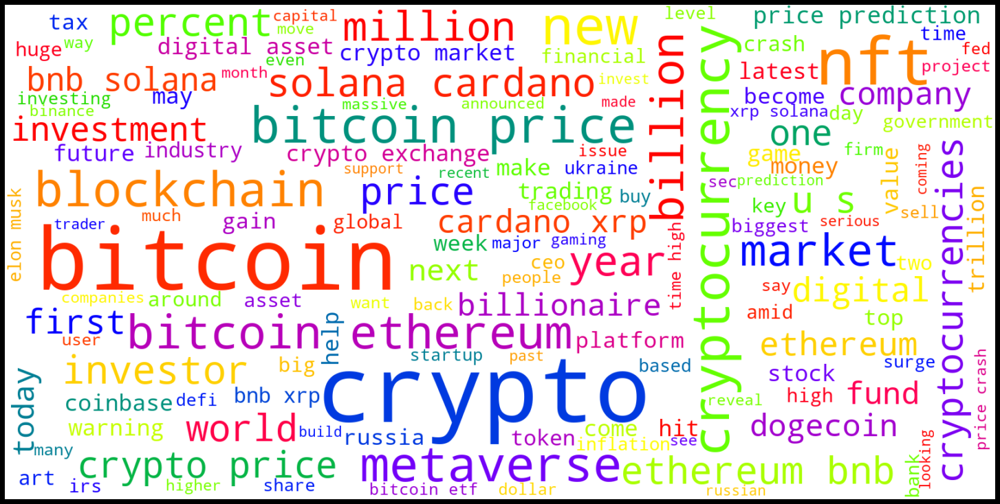

Wordcloud for Stock Market News


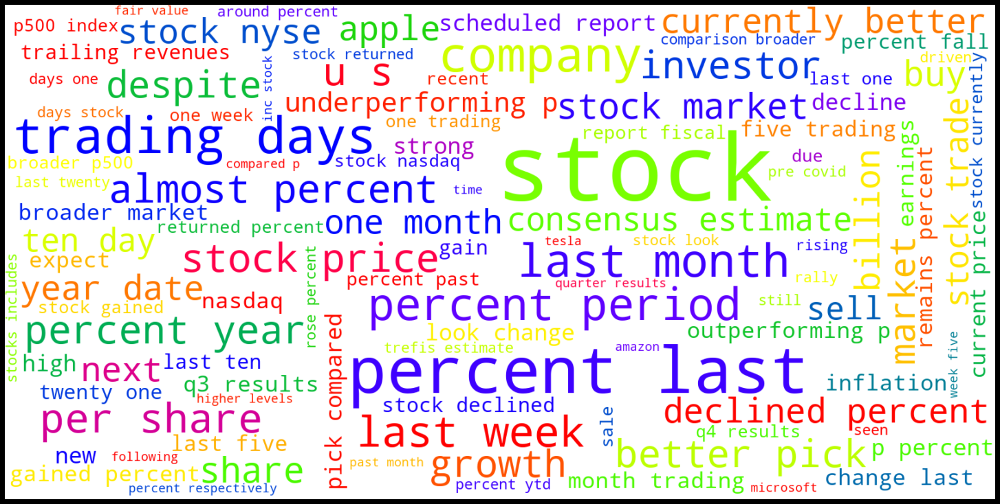

Wordcloud for Finance News


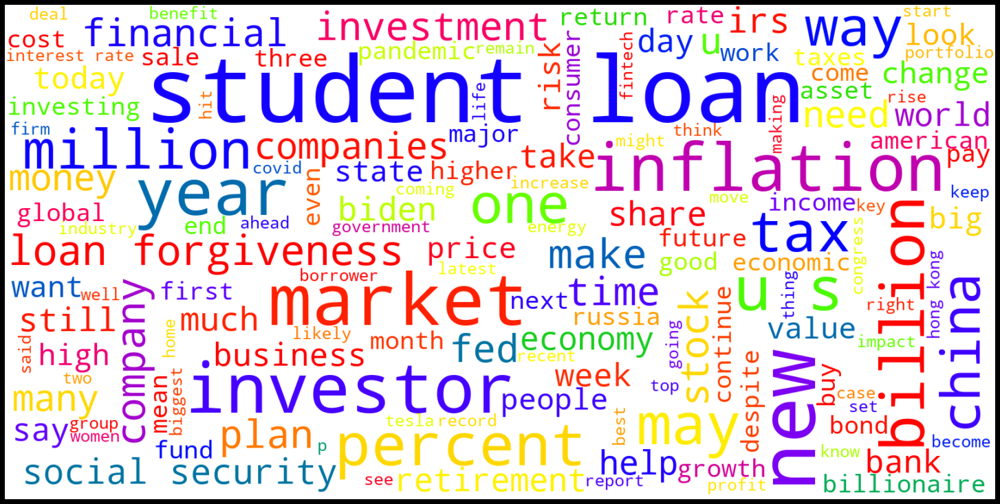

Wordcloud for MANA Announcement


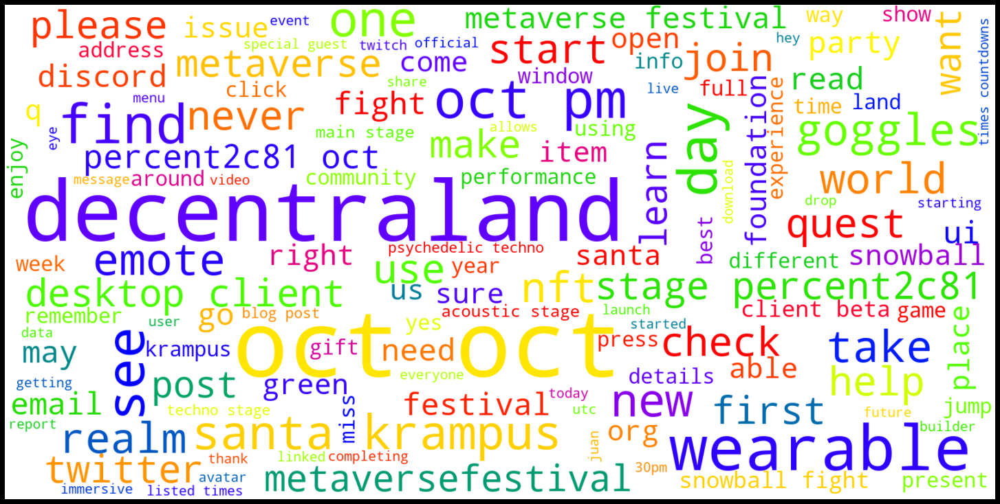

Wordcloud for MANA General


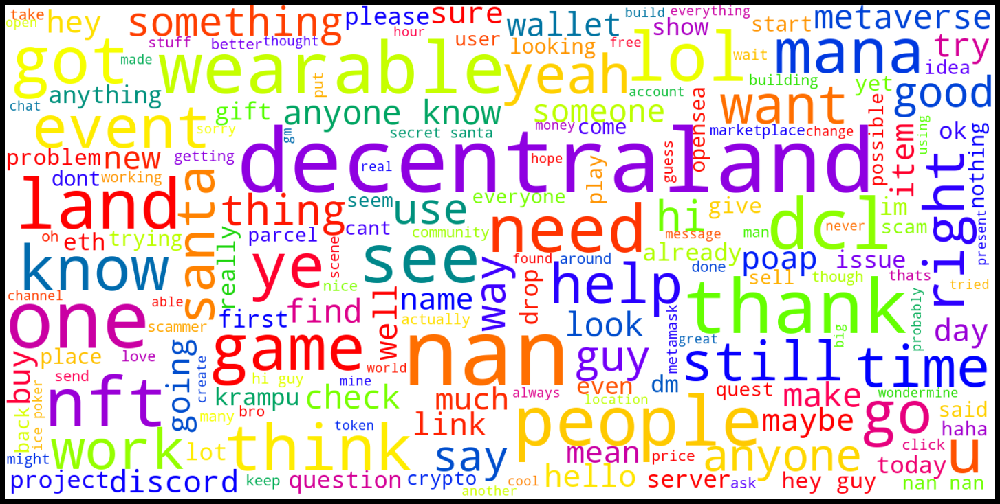

Wordcloud for SAND Announcement


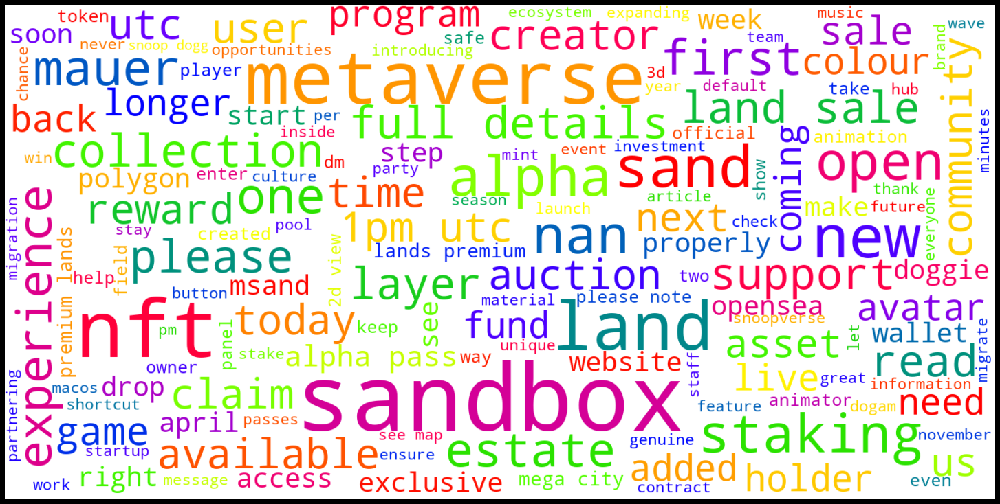

Wordcloud for SAND General


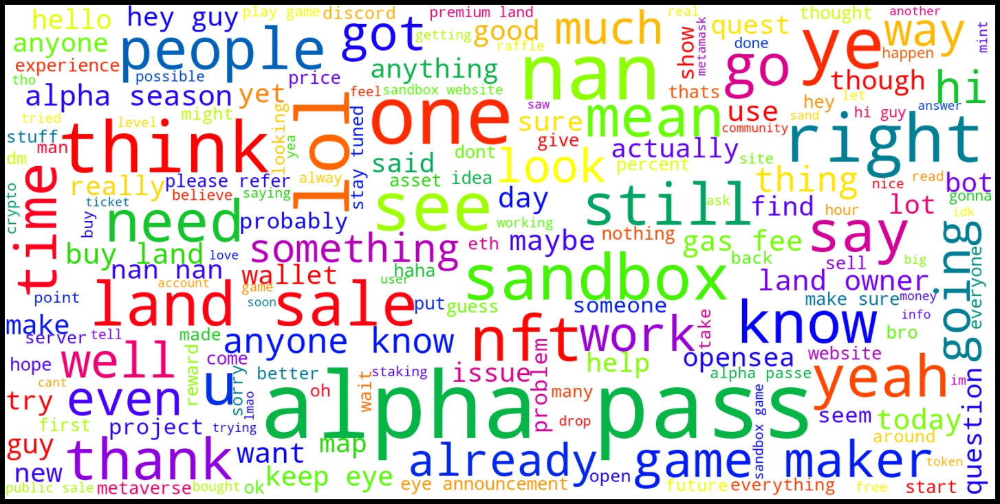

Wordcloud for THETA Announcement


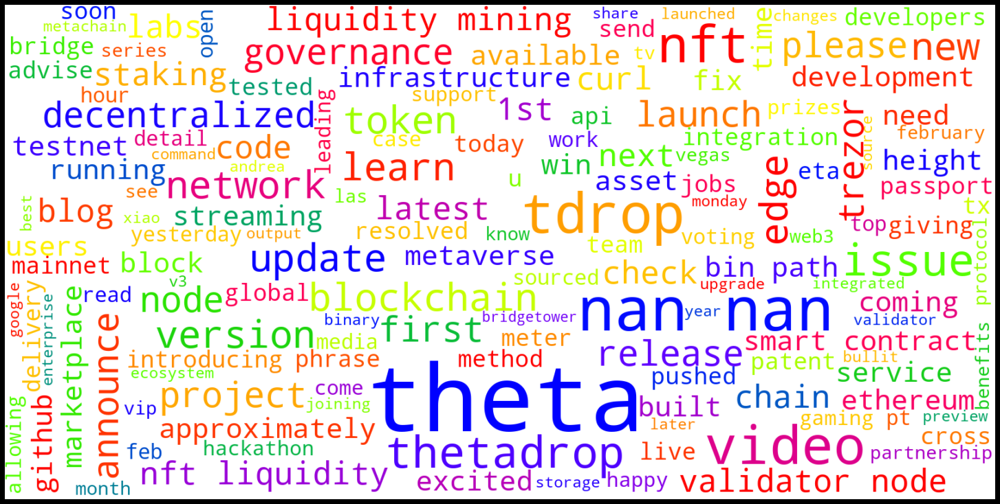

Wordcloud for THETA General


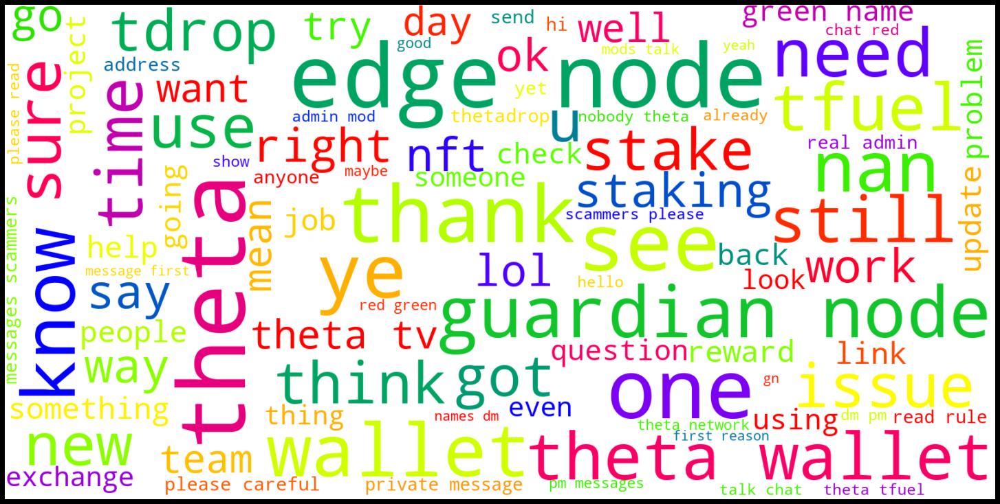

Wordcloud for AXS Announcement


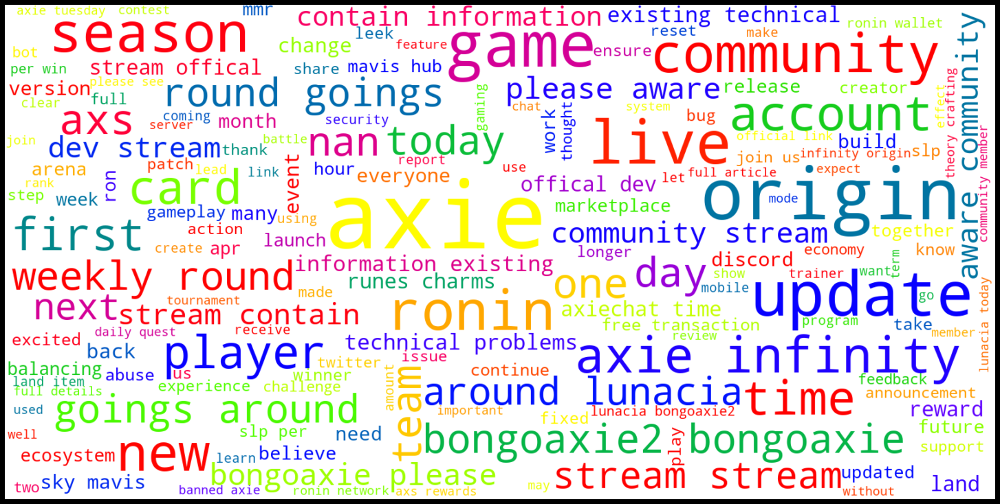

Wordcloud for AXS General


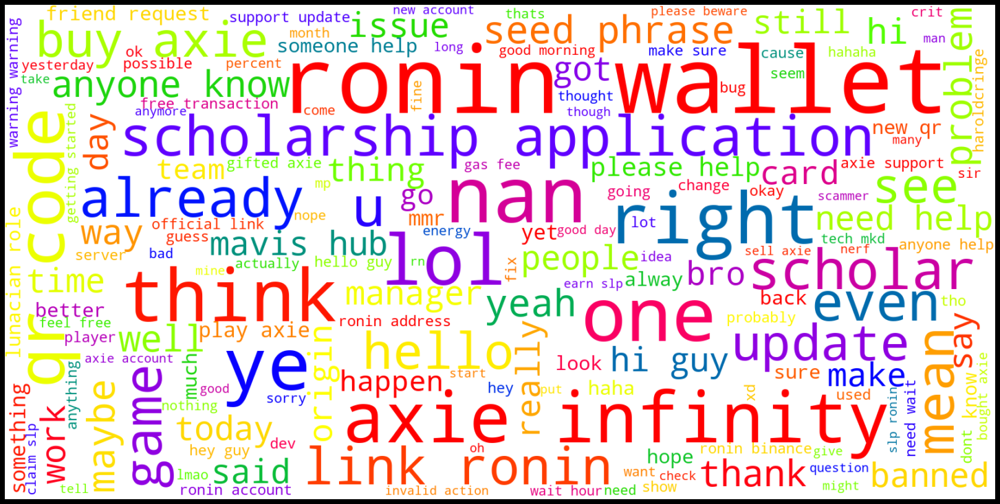

Wordcloud for STX Announcement


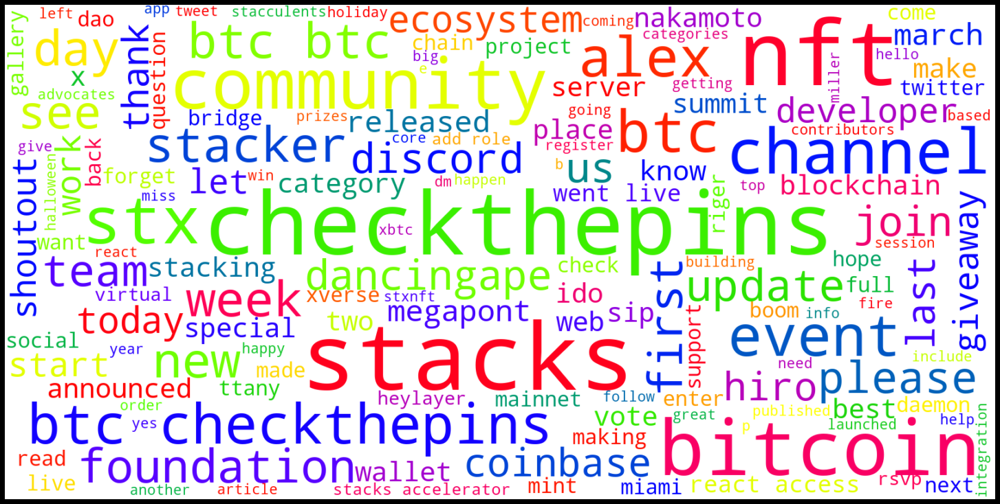

Wordcloud for STX General


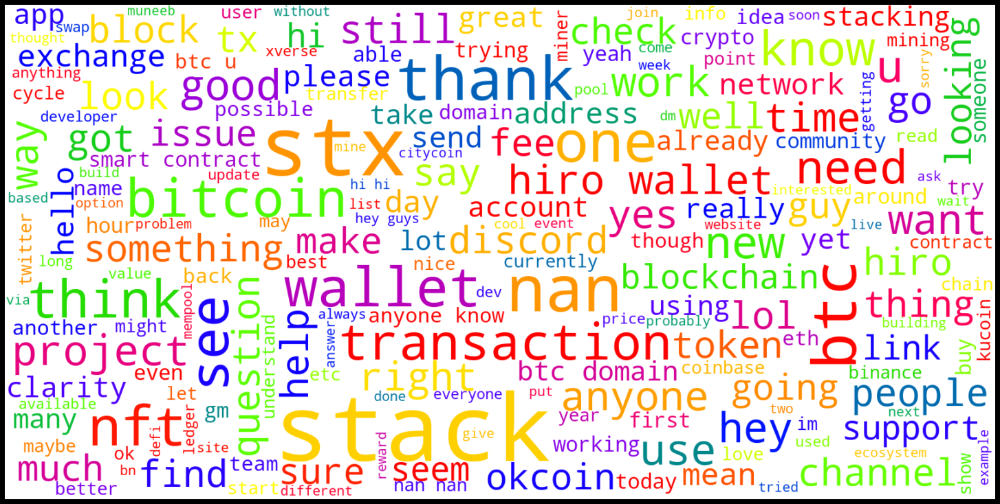

In [226]:
print('Wordcloud for {0}'.format("Cryto News"))
crypto_news_word = news[news["category"]=='Cryptocurrencies']
word_cloud(crypto_news_word['content'].values)

print('Wordcloud for {0}'.format("Stock Market News"))
stock_market_news_word = news[news["category"]=='Stock Market']
word_cloud(stock_market_news_word['content'].values)

print('Wordcloud for {0}'.format("Finance News"))
finance_news_word = news[news["category"]=='Finance']
word_cloud(finance_news_word['content'].values)

print('Wordcloud for {0}'.format("MANA Announcement"))
word_cloud(MANA_announcement['content'].values)

print('Wordcloud for {0}'.format("MANA General"))
word_cloud(MANA_general['content'].values)

print('Wordcloud for {0}'.format("SAND Announcement"))
word_cloud(SAND_announcement['content'].values)

print('Wordcloud for {0}'.format("SAND General"))
word_cloud(SAND_general['content'].values)

print('Wordcloud for {0}'.format("THETA Announcement"))
word_cloud(THETA_announcement['content'].values)

print('Wordcloud for {0}'.format("THETA General"))
word_cloud(THETA_general['content'].values)

print('Wordcloud for {0}'.format("AXS Announcement"))
word_cloud(AXS_announcement['content'].values)

print('Wordcloud for {0}'.format("AXS General"))
word_cloud(AXS_general['content'].values)

print('Wordcloud for {0}'.format("STX Announcement"))
word_cloud(STX_announcement['content'].values)

print('Wordcloud for {0}'.format("STX General"))
word_cloud(STX_general['content'].values)

# Plot Price Change vs Type of Sentiment

In [180]:
def plot_pricing_compare_sentiment(CryptoTitle, CryptoNews, StocksNews, FinanceNews, num_plot=5):
    # create figure and axis objects with subplots()
    CryptoNews.reset_index()
    StocksNews.reset_index()
    
    fig,ax = plt.subplots(num_plot,1,figsize=(20,20))
    plt.subplots_adjust(hspace = 0.4)
    
    # first plot crypto news vs price change
    plot_xy(ax,0,CryptoNews,"{0} price change vs Crypto News".format(CryptoTitle))
    
    # Second plot crypto news vs price change
    plot_xy(ax,1,StocksNews,"{0} price change vs Stock Market News".format(CryptoTitle))
    
    FinanceNews.reset_index()
    # Third plot crypto news vs price change
    plot_xy(ax,2,FinanceNews,"{0} price change vs Finance News".format(CryptoTitle))
    
    plt.show()


In [206]:
MANA_CryptoNews['simulate'] = MANA_CryptoNews[['pct_change','sentiment_score']].apply(
                                lambda x: 1 if x['pct_change'] > 0.01 and x['sentiment_score'] > 0.3 
                                else 0, axis=1)
MANA_CryptoNews

,High,Low,Open,Close,Volume,Adj Close,pct_change,sentiment_score,sentiment_score_1,simulate
date,,,,,,,,,,
2021-10-01,0.759664,0.680543,0.689574,0.752952,118813928,0.752952,0.000000,0.554997,0.000000,0
2021-10-02,0.782058,0.739827,0.753739,0.753345,96996179,0.753345,0.052199,0.629249,0.554997,1
2021-10-03,0.771574,0.739199,0.752185,0.765275,76887615,0.765275,1.583602,-0.834325,0.629249,0
2021-10-04,0.828786,0.726742,0.768490,0.766261,242492275,0.766261,0.128840,0.514501,-0.834325,1
2021-10-05,0.784447,0.747183,0.766634,0.781664,119228151,0.781664,2.010155,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...
2022-04-25,2.003885,1.855495,2.002224,1.979893,311552030,1.979893,-1.083649,0.316152,-0.269543,0
2022-04-26,2.004161,1.791904,1.979332,1.806895,251827452,1.806895,-8.737743,0.000000,0.000000,0
2022-04-27,1.885767,1.799823,1.807389,1.845388,207930819,1.845388,2.130342,0.000000,0.000000,0


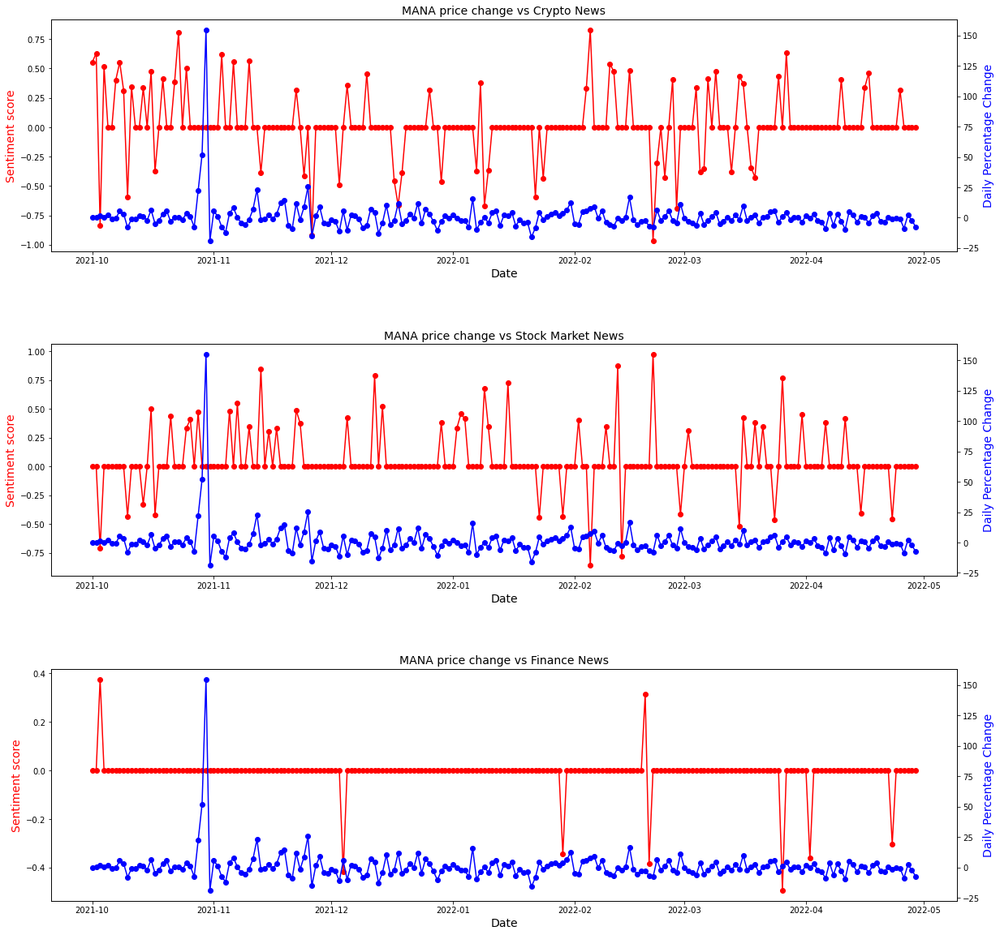

In [183]:
MANA_CryptoNews = MANA.join(crypto_news_filter).fillna(0)
MANA_StocksNews = MANA.join(stocks_market_news_filter).fillna(0)
MANA_FinanceNews = MANA.join(finance_news_filter).fillna(0)

plot_pricing_compare_sentiment("MANA", MANA_CryptoNews, MANA_StocksNews, MANA_FinanceNews, num_plot=3)

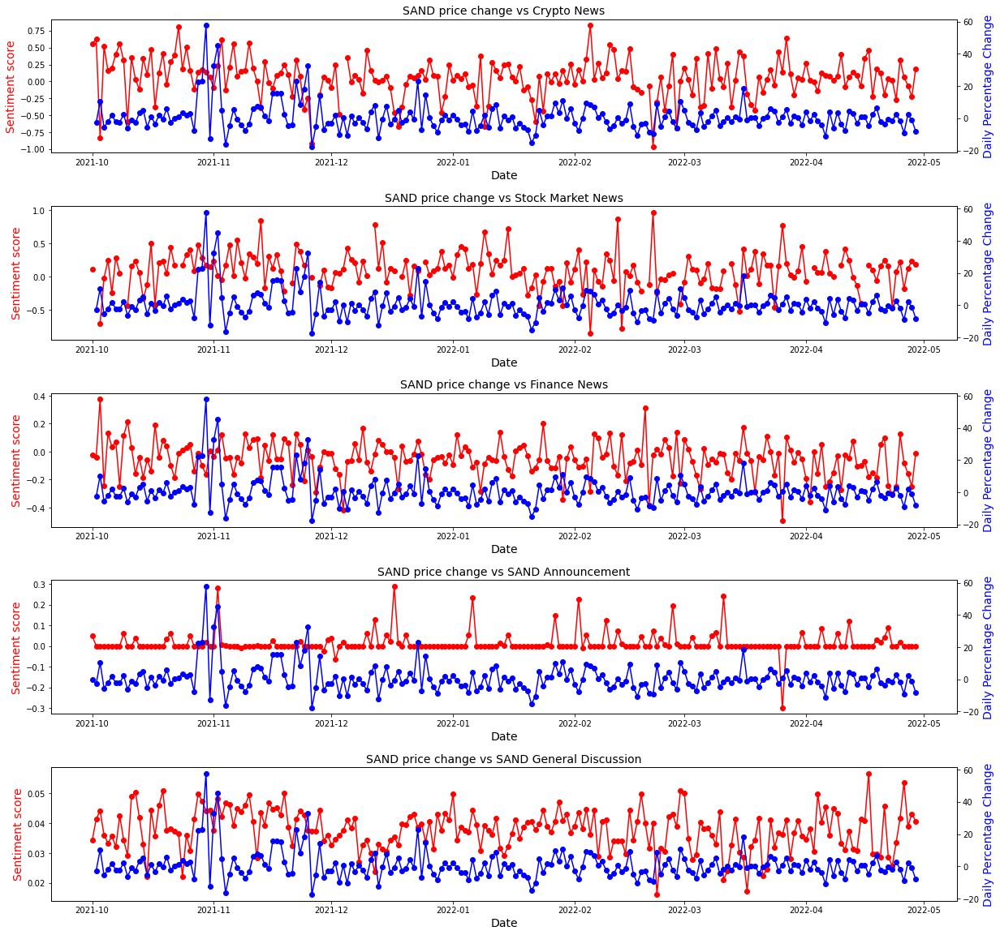

In [93]:
SAND_CryptoNews = SAND.join(crypto_news)
SAND_StocksNews = SAND.join(stocks_market_news)
SAND_FinanceNews = SAND.join(finance_news)
SAND_Annoncement = SAND.join(sand_announcement_by_day).fillna(0)
SAND_General = SAND.join(sand_general_by_day)

plot_pricing_compare_sentiment(SAND_CryptoNews, SAND_StocksNews, SAND_FinanceNews, SAND_Annoncement, SAND_General,
                              "SAND")

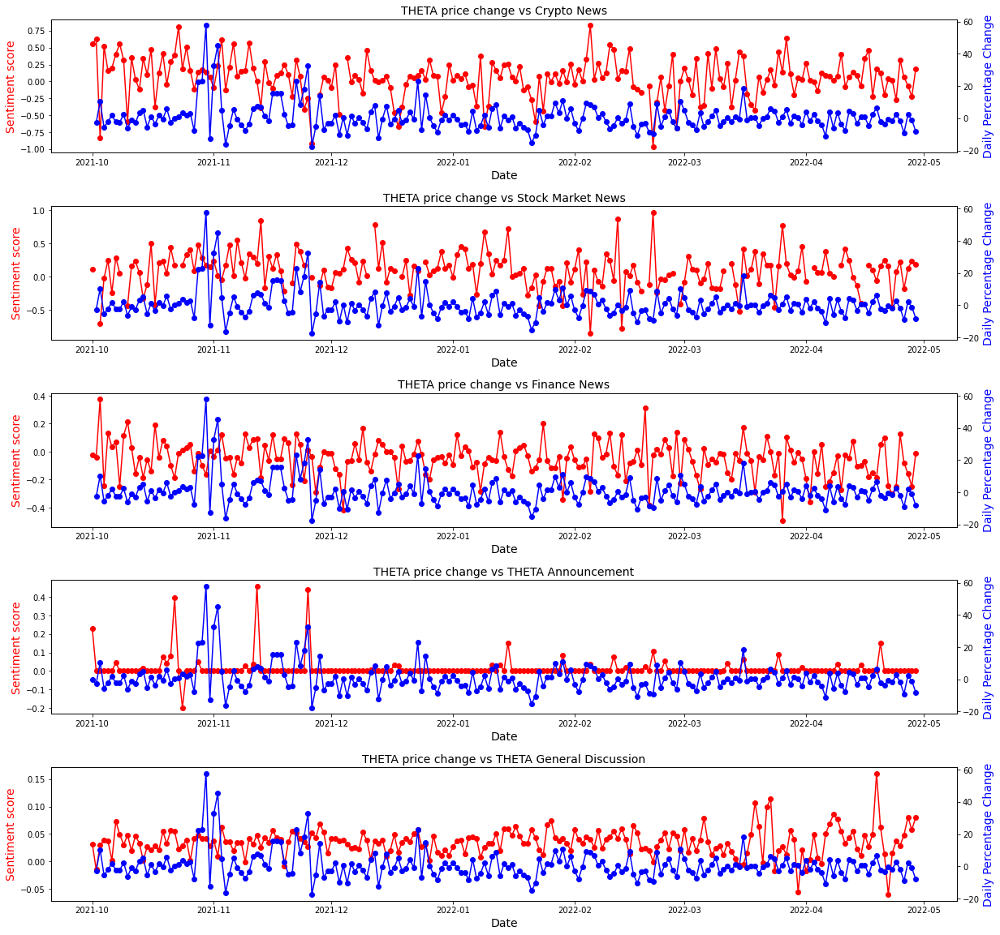

In [94]:
THETA_CryptoNews = SAND.join(crypto_news)
THETA_StocksNews = SAND.join(stocks_market_news)
THETA_FinanceNews = SAND.join(finance_news)
THETA_Annoncement = SAND.join(theta_announcement_by_day).fillna(0)
THETA_General = SAND.join(theta_general_by_day)

plot_pricing_compare_sentiment(THETA_CryptoNews, THETA_StocksNews, THETA_FinanceNews, THETA_Annoncement, THETA_General,
                              "THETA")

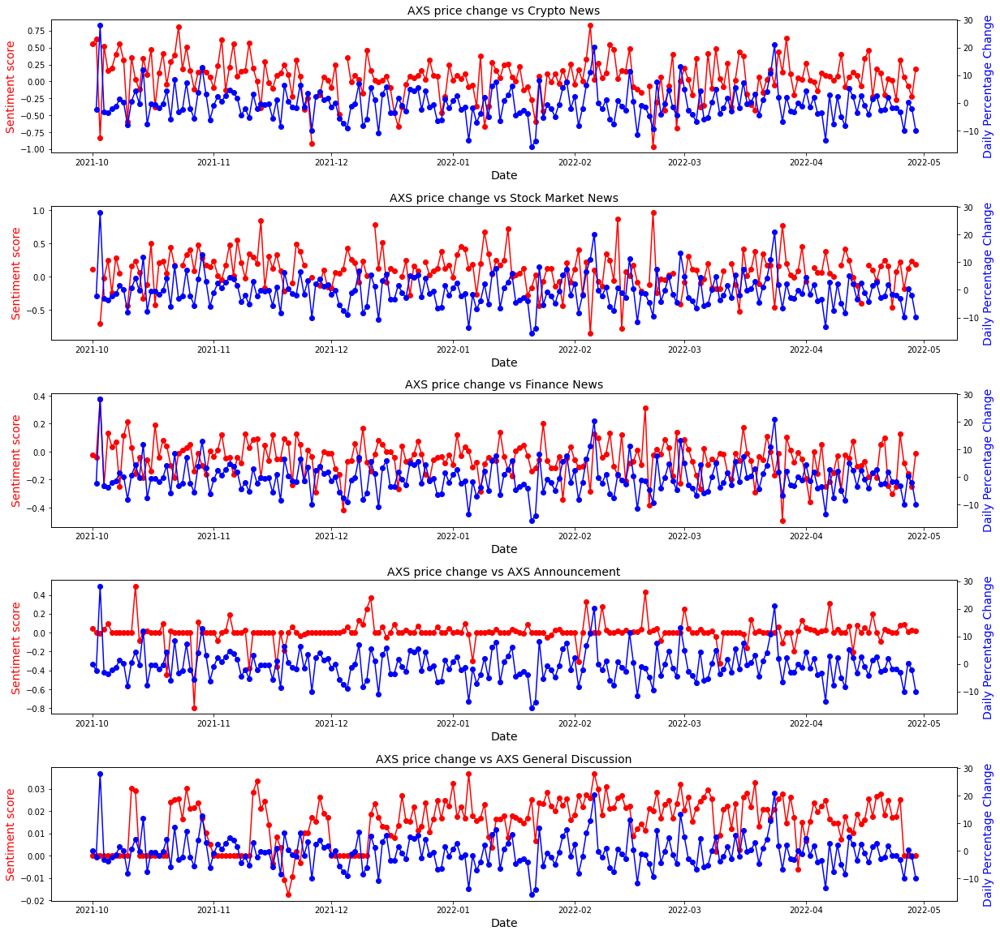

In [96]:
AXS_CryptoNews = AXS.join(crypto_news)
AXS_StocksNews = AXS.join(stocks_market_news)
AXS_FinanceNews = AXS.join(finance_news)
AXS_Annoncement = AXS.join(axs_announcement_by_day).fillna(0)
AXS_General = AXS.join(axs_general_by_day).fillna(0)

plot_pricing_compare_sentiment(AXS_CryptoNews, AXS_StocksNews, AXS_FinanceNews, AXS_Annoncement, AXS_General,
                              "AXS")

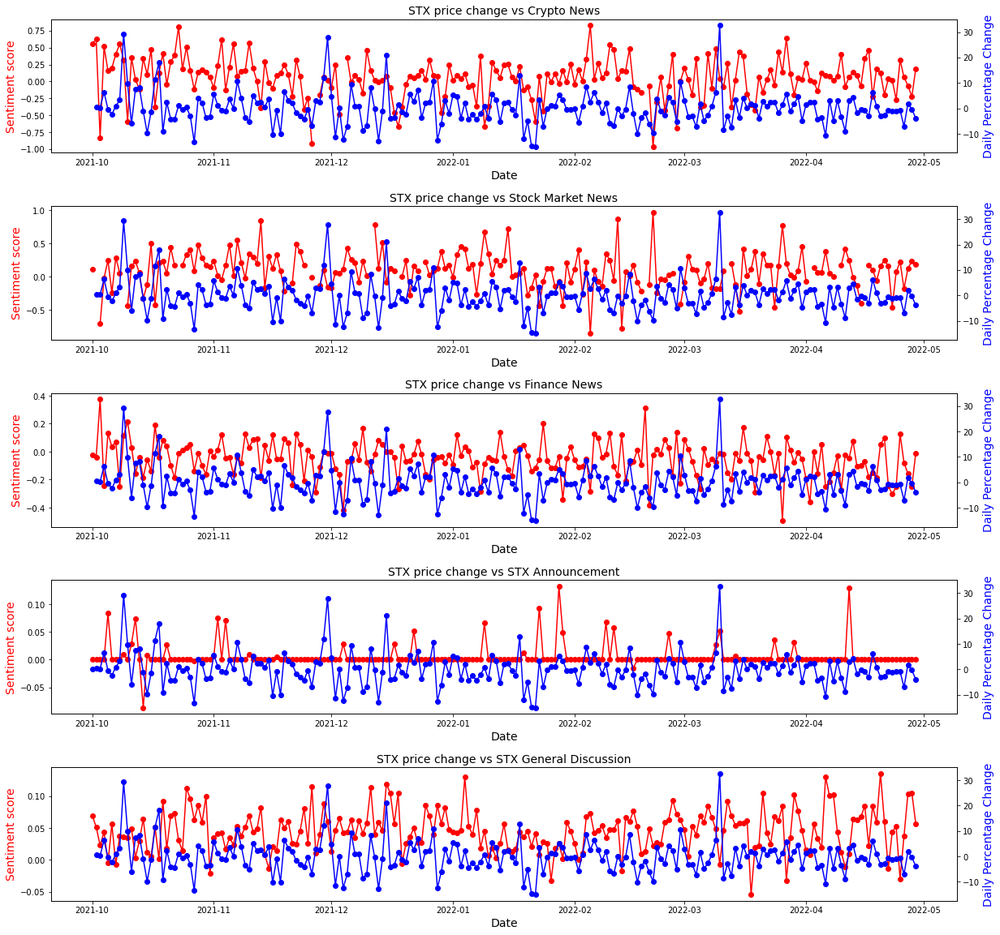

In [97]:
STX_CryptoNews = STX.join(crypto_news)
STX_StocksNews = STX.join(stocks_market_news)
STX_FinanceNews = STX.join(finance_news)
STX_Annoncement = STX.join(stx_announcement_by_day).fillna(0)
STX_General = STX.join(stx_general_by_day)

plot_pricing_compare_sentiment(STX_CryptoNews, STX_StocksNews, STX_FinanceNews, STX_Annoncement, STX_General,
                              "STX")